## Procesado de las series temporales

In [1]:
! pip install darts
! pip install HydroErr
! pip install pycaret


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 917.3/917.3 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 24.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.0/165.0 kB 11.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 3.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 812.2/812.2 kB 31.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 868.8/868.8 kB 42.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 223.5/223.5 kB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 278.2/278.2 kB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.6/40.6 

### Importamos las librerías necesarias

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sn
import HydroErr as he

from darts.metrics import mape, r2_score
from darts import TimeSeries
from darts.models import (
    RNNModel,
    TCNModel,
    TransformerModel,
    NBEATSModel,
    BlockRNNModel,
    VARIMA,
    Prophet
)

from prophet import Prophet
from prophet.plot import add_changepoints_to_plot
from prophet.diagnostics import cross_validation, performance_metrics
from pycaret.time_series import *
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.stats.descriptivestats import describe

from pmdarima.model_selection import train_test_split


import warnings
warnings.filterwarnings("ignore") #Evitamos que se muestren warnings

### Cargamos las series temporales y las procesamos

Se crean cuatro dataframes, uno con la serie orginal a intervalos diarios y tres nuevos dataframes con la serie de aportaciones diarias, mensuales y anuales. Se eliminan los NaN.

In [6]:
#Cambiar por la serie a procesar

df = pd.read_csv('https://raw.githubusercontent.com/aledor07/Evapotranspiration_forecasting/main/Data/Puerto%20de%20la%20Cruz.csv')

#Procesamiento

df["ds"] =  pd.to_datetime(df["Fecha"], format="%d/%m/%Y")

df.set_index(df['ds'], inplace=True)

#Serie diaria
# ,'Temp Media (ºC)','Temp Mínima (ºC)','Temp Max (ºC)','Velviento (m/s)','Radiación (MJ/m2)'
df_d = df[['EtPMon','Temp Media (ºC)','Temp Mínima (ºC)','Temp Max (ºC)','Velviento (m/s)','Radiación (MJ/m2)']]
df_d.rename(columns={'EtPMon': 'y'}, inplace=True)
df_d= df_d[df_d['y'] != 0]
df_d=df_d.asfreq('D')
df_d.reset_index(inplace=True)
df_d=df_d.fillna(method='bfill')
df_d.set_index(df_d['ds'], inplace=True)

df_d = df_d[(df_d['ds'] > '2018-5-1') & (df_d['ds'] <= '2023-5-1')]
#df_d = df_d.groupby([pd.Grouper(key='ds', freq='W')]).sum()

#df_d=df_d.reset_index()


In [7]:
df_d

,ds,y,Temp Media (ºC),Temp Mínima (ºC),Temp Max (ºC),Velviento (m/s),Radiación (MJ/m2)
ds,,,,,,,
2018-05-02,2018-05-02,3.29,17.21,11.72,22.24,0.38,19.89
2018-05-03,2018-05-03,4.13,18.10,13.72,22.49,0.37,26.01
2018-05-04,2018-05-04,2.08,16.78,12.92,19.90,0.27,10.88
2018-05-05,2018-05-05,2.38,17.09,14.59,21.57,0.26,12.83
2018-05-06,2018-05-06,2.81,17.07,14.06,20.71,0.38,15.99
...,...,...,...,...,...,...,...
2023-04-27,2023-04-27,4.38,19.89,15.33,25.25,0.22,26.68
2023-04-28,2023-04-28,4.34,19.95,14.79,25.32,0.23,26.26
2023-04-29,2023-04-29,4.49,20.76,14.73,26.59,0.23,27.09


### Estadísticos de la serie

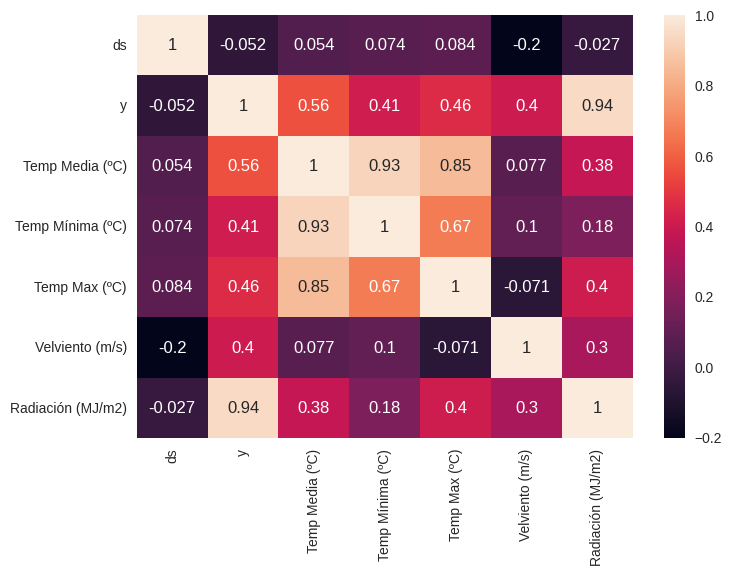

In [8]:
# Matriz de correlación

corr_matrix = df_d.corr()

sn.heatmap(corr_matrix, annot=True)
plt.show()

### Valores de la serie diaria

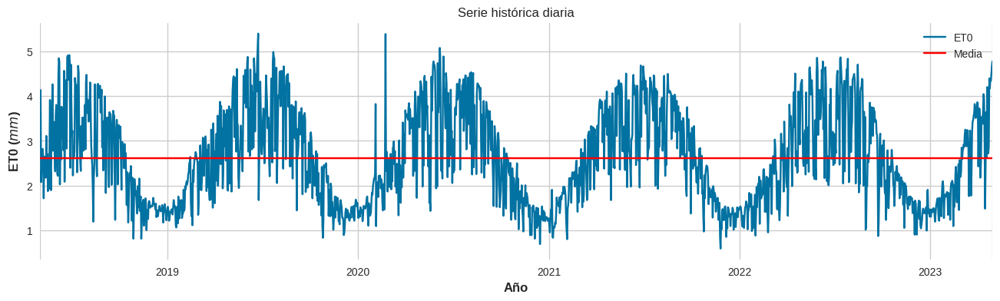

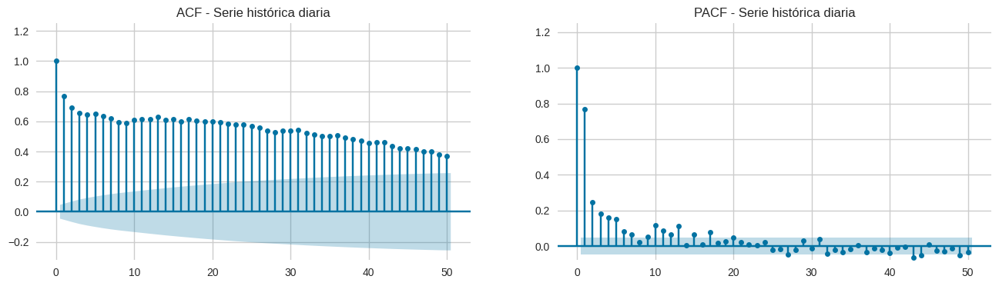

,y,Temp Media (ºC),Temp Mínima (ºC),Temp Max (ºC),Velviento (m/s),Radiación (MJ/m2)
nobs,1.826000e+03,1.826000e+03,1.826000e+03,1826.000000,1826.000000,1.826000e+03
missing,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00
mean,2.614387e+00,1.930138e+01,1.541013e+01,24.187492,0.295515,1.550175e+01
std_err,2.443524e-02,5.904232e-02,6.557446e-02,0.060876,0.002521,1.392979e-01
upper_ci,2.662279e+00,1.941710e+01,1.553865e+01,24.306806,0.300455,1.577477e+01
lower_ci,2.566494e+00,1.918566e+01,1.528160e+01,24.068177,0.290575,1.522873e+01
std,1.044160e+00,2.522980e+00,2.802110e+00,2.601334,0.107707,5.952441e+00
iqr,1.770000e+00,4.277500e+00,4.530000e+00,3.930000,0.130000,8.912500e+00
iqr_normal,1.312103e+00,3.170915e+00,3.358094e+00,2.913313,0.096369,6.606846e+00
mad,8.936471e-01,2.180224e+00,2.375880e+00,2.131301,0.077038,4.948705e+00


In [9]:
#Procesamiento de la serie histórica diaria

#Gráfica de la serie histórica
title='Serie histórica diaria'
df_d['y'].plot(title=title,figsize=(16, 4))
plt.axhline(y=np.nanmean(df_d.y),color="red",)
plt.xlabel('Año', fontsize=12)
plt.ylabel('ET0 ($mm$)', fontsize=12)
plt.legend(['ET0','Media'])

#Autocorrelograma
acf(df_d['y'])

#PACF
pacf(df_d['y'],alpha=.05)

lags = 50

#Gráficas conjuntas
fig, ax = plt.subplots(1,2,figsize=(16,4))
plot_acf(df_d['y'],title='ACF - Serie histórica diaria',lags=lags, auto_ylims=True, ax=ax[0])
plot_pacf(df_d['y'],title='PACF - Serie histórica diaria',lags=lags, auto_ylims=True, ax=ax[1])
plt.show()



#Estadísticas de la serie temporal
describe(df_d)

### Guardado de las serie procesadas a Excel

In [ ]:
df_d.to_excel(r'', index=True)

In [10]:
test_size = 0.3 # Cambiar la amplitud de set de datos para el TEST

train , test = train_test_split(df_d, test_size=test_size) #Dividmos el set de datos para entrenar el modelo

print(f"Number of obs. in train data: {len(train)}")
print(f"Number of obs. in test data: {len(test)}")

Number of obs. in train data: 1278
Number of obs. in test data: 548


In [ ]:
train

,ds,y
ds,,
2000-11-22,2000-11-22,1.43
2000-11-23,2000-11-23,1.70
2000-11-24,2000-11-24,1.73
2000-11-25,2000-11-25,1.41
2000-11-26,2000-11-26,1.79
...,...,...
2016-08-19,2016-08-19,3.95
2016-08-20,2016-08-20,2.96
2016-08-21,2016-08-21,1.62


# Prophet

In [ ]:
## Entrenamiento de modelo Prophet

prophet_model = Prophet(

#Hiperparámetros - Cambiar por los de mejor ajuste
                            yearly_seasonality='auto',
                            weekly_seasonality='auto',
                            #seasonality_prior_scale=10,
                            #daily_seasonality='auto',
                            #changepoint_prior_scale=0.015,
                            #changepoint_range=0.75,
                            #growth='linear',
                            interval_width=0.95

                            )


#prophet_model.add_regressor('Radiación (MJ/m2)')



#prophet_model.add_seasonality(name='monthly', period=30.5, fourier_order=7, prior_scale=10, mode ='multiplicative')
prophet_model.fit(train)


# Creamos el array con el periodo para el que queremos realizar la predicción
prediction_period = prophet_model.make_future_dataframe(periods = len(test), include_history=True, freq='W')

#prediction_period['Radiación (MJ/m2)'] = df_d['Radiación (MJ/m2)']
#prediction_period['Radiación (MJ/m2)'].iloc[:len(train)] = train ['Radiación (MJ/m2)']
#prediction_period['Radiación (MJ/m2)'].iloc[-len(test):] = regressor ['Radiación (MJ/m2)']

# Se realiza la predicción
forecast = prophet_model.predict(prediction_period)

# Valoramos el ajuste con las métricas
real = df_d['y']
real = real.set_axis(df_d['ds'])

forecast.yhat[forecast.yhat.lt(0)] = 0 # Se eliminan los valores negativos predictivos

predictions = forecast.iloc[-len(test):]['yhat']
predictions = predictions.set_axis(forecast.iloc[-len(test):]['ds'])
fits = forecast.iloc[:len(train)]['yhat']
fits = fits.set_axis(forecast.iloc[:len(train)]['ds'])
actuals = test['y']
actuals = actuals.set_axis(forecast.iloc[-len(test):]['ds'])

RMSE = he.rmse(predictions, actuals)
MAE = he.mae(predictions, actuals)
NSE = he.nse(predictions, actuals)
R2 = he.r_squared(predictions, actuals)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp15s_25rd/16uq658m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp15s_25rd/lykqxung.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89466', 'data', 'file=/tmp/tmp15s_25rd/16uq658m.json', 'init=/tmp/tmp15s_25rd/lykqxung.json', 'output', 'file=/tmp/tmp15s_25rd/prophet_modelq65qwc1j/prophet_model-20230826205914.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:59:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:59:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


### Coeficientes

In [ ]:
print('El valor de MAE obtenido es: '+str(MAE))
print('El valor de RMSE obtenido es: '+str(RMSE))
print('El valor de NSE obtenido es: '+str(NSE))
print('El valor de R2 obtenido es: '+str(R2))

El valor de MAE obtenido es: 1.8813559403403277
El valor de RMSE obtenido es: 2.544187083925372
El valor de NSE obtenido es: 0.8353713664683228
El valor de R2 obtenido es: 0.8387313488285815


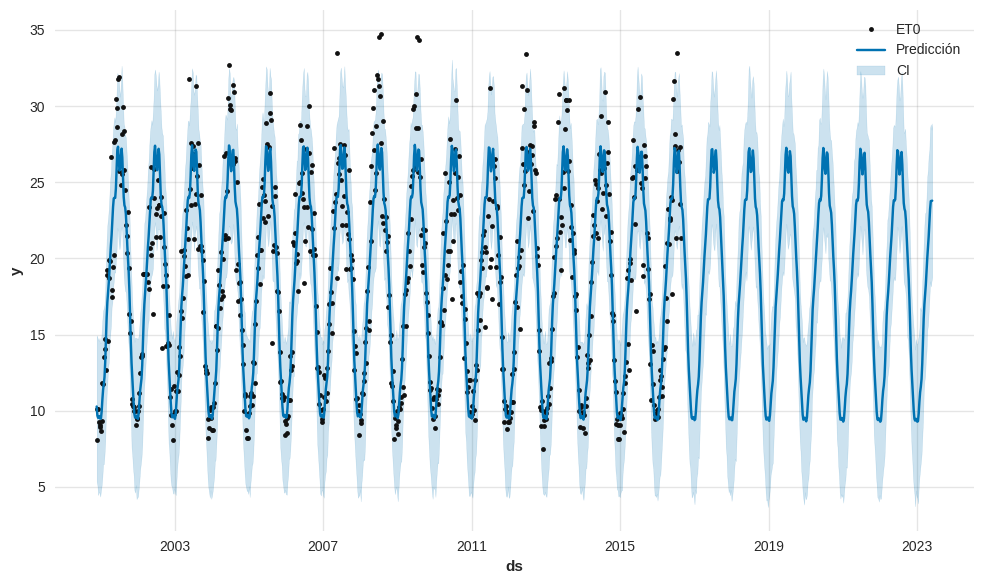

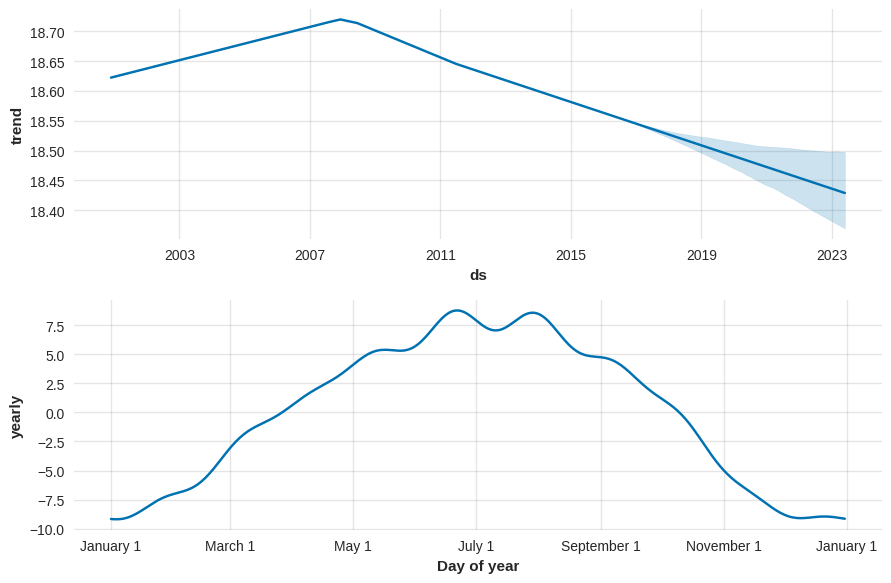

In [ ]:
fig1 = prophet_model.plot(forecast)
plt.legend(['ET0', 'Predicción', 'CI'])
plt.show()

fig2 = prophet_model.plot_components(forecast)


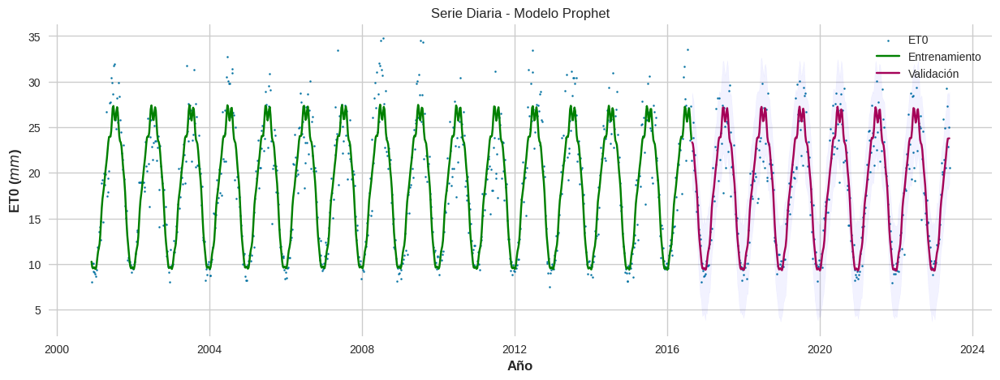

In [ ]:
#Mostramos la gráfica con la predicción

fig, ax = plt.subplots(1, 1, figsize=(15, 5))

ax.scatter(real.index, real, s=2)
ax.plot(fits, color = 'green',linestyle = 'solid')
ax.plot(predictions, color = 'm',linestyle = 'solid')
ax.fill_between(predictions.index,
                forecast.iloc[-len(test):]['yhat_lower'],
                forecast.iloc[-len(test):]['yhat_upper'],color='blue',alpha=.05)

plt.title('Serie Diaria - Modelo Prophet')
plt.xlabel('Año', fontsize=12)
plt.ylabel('ET0 ($mm$)', fontsize=12)
plt.legend(['ET0','Entrenamiento','Validación'])

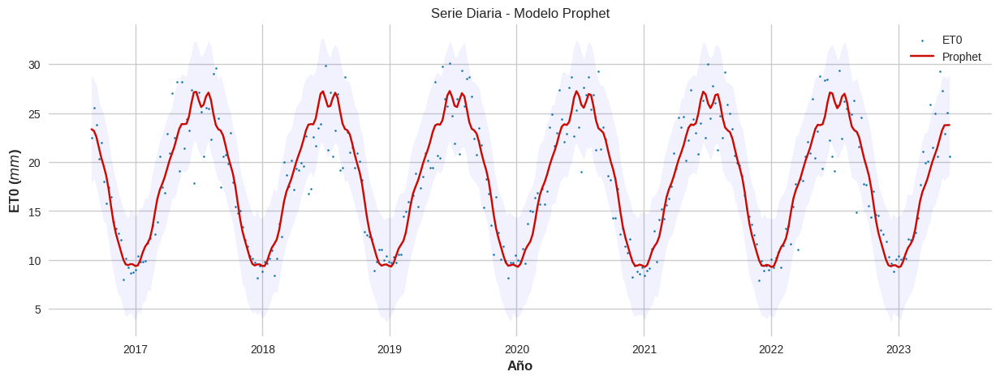

In [ ]:
#Mostramos la gráfica con la predicción

fig, ax = plt.subplots(1, 1, figsize=(15, 5))


ax.scatter(real.iloc[-len(test):].index, real.iloc[-len(test):], s=2)
ax.plot(predictions, color = 'r',linestyle = 'solid')
ax.fill_between(predictions.index,
                forecast.iloc[-len(test):]['yhat_lower'],
                forecast.iloc[-len(test):]['yhat_upper'],color='blue',alpha=.05)

plt.title('Serie Diaria - Modelo Prophet')
plt.xlabel('Año', fontsize=12)
plt.ylabel('ET0 ($mm$)', fontsize=12)
plt.legend(['ET0','Prophet'])

### Backtesting

In [ ]:

series = TimeSeries.from_dataframe(df_d, 'ds', 'y')
train, val = series.split_before(0.7)

model = Prophet()
prophet_m = model.fit(train)
prediction = model.predict(len(val))

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj4xdrl6l/i4aqf5at.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj4xdrl6l/1i1udh_y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83776', 'data', 'file=/tmp/tmpj4xdrl6l/i4aqf5at.json', 'init=/tmp/tmpj4xdrl6l/1i1udh_y.json', 'output', 'file=/tmp/tmpj4xdrl6l/prophet_model8nnp1sqt/prophet_model-20230826201415.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:14:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:14:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
prophet_m.backtest(series= series, start=pd.Timestamp('20220501'), forecast_horizon=1, metric=mape)

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj4xdrl6l/o1cmxkue.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpj4xdrl6l/tms1sckv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36875', 'data', 'file=/tmp/tmpj4xdrl6l/o1cmxkue.json', 'init=/tmp/tmpj4xdrl6l/tms1sckv.json', 'output', 'file=/tmp/tmpj4xdrl6l/prophet_modelkzbfojrh/prophet_model-20230826201429.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:14:29 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:14:29 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonalit

11.914421600563324

## Predicciones

In [ ]:
train

,EtPMon,y,Temp Mínima (ºC),Temp Max (ºC),Velviento (m/s),Radiación (MJ/m2),ds
ds,,,,,,,
2000-11-26,8.06,90.67,71.57,114.61,1.95,55.70,2000-11-26
2000-12-03,10.13,123.63,96.65,158.30,2.01,70.24,2000-12-03
2000-12-10,10.10,119.50,92.31,155.00,2.29,73.46,2000-12-10
2000-12-17,9.24,113.28,78.62,156.13,2.06,70.57,2000-12-17
2000-12-24,9.09,115.87,85.65,148.18,2.64,58.79,2000-12-24
...,...,...,...,...,...,...,...
2016-07-24,27.10,152.08,132.07,173.76,2.47,149.23,2016-07-24
2016-07-31,26.34,153.85,135.65,175.90,2.57,142.99,2016-07-31
2016-08-07,23.54,154.23,130.13,178.64,2.15,124.08,2016-08-07


In [ ]:
#Cambiar hiperparámetros y periodo de predicción

prophet_model = Prophet(
        #Hiperparámetros - Cambiar por los de mejor ajuste
                        yearly_seasonality='auto',
                        #weekly_seasonality='auto',
                        #seasonality_prior_scale=10,
                        #daily_seasonality='auto',
                        #changepoint_prior_scale=0.01,
                        #changepoint_range=0.70,
                        #growth='linear',
                        interval_width=0.95

                        )

#prophet_model.add_regressor('Temp Max (ºC)')
#prophet_model.add_regressor('Temp Mínima (ºC)')
#prophet_model.add_regressor('Radiación (MJ/m2)')

#prophet_model.add_seasonality(name='monthly', period=30.5, fourier_order=7, prior_scale=10, mode ='multiplicative')
prophet_model.fit(train)

prediction_period = prophet_model.make_future_dataframe(periods = len(test), freq ='W', include_history=False)

forecast = prophet_model.predict(prediction_period)
forecast.yhat[forecast.yhat.lt(0)] = 0 # Se eliminan los valores negativos predictivos
forecast

regressor = pd.DataFrame()
regressor['Radiación (MJ/m2)']=forecast['yhat'].to_numpy()
#prediction_period['Temp Mínima (ºC)'].iloc[-7:]=forecast['yhat'].iloc[-7:].to_numpy()


INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp15s_25rd/wzjmtnxx.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp15s_25rd/h94du0ea.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=28288', 'data', 'file=/tmp/tmp15s_25rd/wzjmtnxx.json', 'init=/tmp/tmp15s_25rd/h94du0ea.json', 'output', 'file=/tmp/tmp15s_25rd/prophet_modelxvp8mlct/prophet_model-20230826203904.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:39:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:39:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [ ]:
prediction_period

,ds,Temp Mínima (ºC)
0,2023-05-27,16.605921
1,2023-05-28,16.649087
2,2023-05-29,16.738950
3,2023-05-30,16.738491
4,2023-05-31,16.836570
5,2023-06-01,16.852616
6,2023-06-02,16.902838


In [ ]:
forecast.to_excel(r'', index=True)

## Calculamos el error porcentual al emplear la ET de la semana pasada como predicción a una semana

In [ ]:
df_d['ET_S'] = df_d['y'].shift(7) ## Desplazamos siete días a futuro los valores de ETo


In [ ]:
historical_forecasts.values()

array([[3.31349739],
       [3.34790382],
       [3.32769239],
       [3.32926173],
       [3.32142198],
       [3.32654344],
       [3.33115681],
       [3.34355749],
       [3.36115377],
       [3.33905296],
       [3.33192205],
       [3.32836496],
       [3.32646227],
       [3.33116239],
       [3.34176187],
       [3.37553457],
       [3.35117296],
       [3.36309159],
       [3.36716359],
       [3.37761689],
       [3.39570869],
       [3.42221194],
       [3.45268802],
       [3.4314568 ],
       [3.44471542],
       [3.45366172],
       [3.47649053],
       [3.49963979],
       [3.52935253],
       [3.58210914],
       [3.58257197],
       [3.61328779],
       [3.6290381 ],
       [3.65789175],
       [3.68387809],
       [3.72240092],
       [3.76294537],
       [3.75037881],
       [3.76748373],
       [3.77851377],
       [3.79437318],
       [3.80940934],
       [3.8139524 ],
       [3.84353836],
       [3.80268582],
       [3.79744282],
       [3.79004802],
       [3.785

In [ ]:
# Sumatorio por semana
results = pd.merge(df_d.groupby([pd.Grouper(key='ds', freq='W')])['y'].sum(), df_d.groupby([pd.Grouper(key='ds', freq='W')])['ET_S'].sum(), right_index = True,
               left_index = True)

results.drop(index=results.index[0], axis=0, inplace=True)

check_period = results.loc['2022-05-01':'2023-05-28']
check_period['HF'] = new_df

In [ ]:

check_period
check_period.drop(index=check_period.index[0:1], axis=0, inplace=True)


In [ ]:
new_df['ds'] = new_df.index
new_df = new_df.groupby([pd.Grouper(key='ds', freq='W')])['values'].sum()

In [ ]:
check_period['Diff'] = ((check_period.y - check_period.ET_S) / check_period.y * 100)
check_period['Diff_Prophet'] = ((check_period.y - check_period.HF) / check_period.y * 100)

In [ ]:
describe(check_period)

,y,ET_S,HF,Diff,Diff_Prophet
nobs,57.000000,57.000000,57.000000,5.700000e+01,5.700000e+01
missing,0.000000,0.000000,1.000000,0.000000e+00,1.000000e+00
mean,19.169474,19.056491,18.122936,1.427342e+01,1.315002e+01
std_err,0.827442,0.821203,0.847961,1.810828e+00,1.805615e+00
upper_ci,20.791231,20.666019,19.784909,1.782257e+01,1.668896e+01
lower_ci,17.547717,17.446963,16.460964,1.072426e+01,9.611078e+00
std,6.247051,6.199945,6.345556,1.367145e+01,1.351198e+01
iqr,11.870000,11.840000,11.806147,1.572471e+01,1.266059e+01
iqr_normal,8.799244,8.777005,8.751910,1.165675e+01,9.385307e+00
mad,5.412502,5.341360,5.581182,9.734396e+00,8.434845e+00


In [ ]:
print(check_period['ET_S'].sum())
print(check_period['HF'].sum())

1086.22
1014.8844436381543


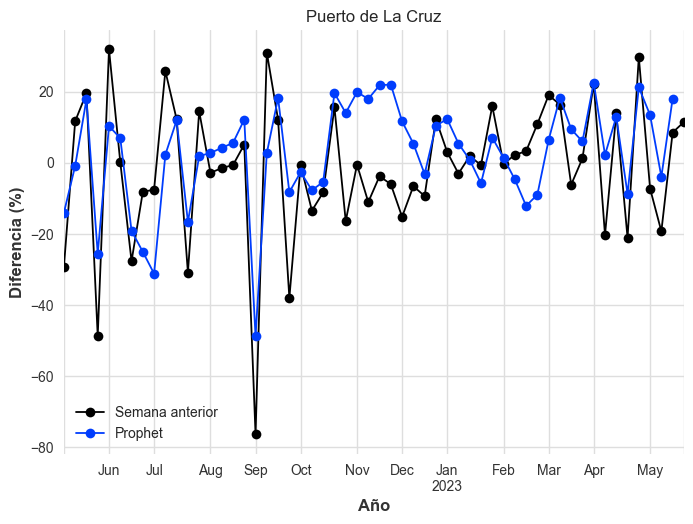

In [ ]:
check_period.plot(y=["Diff",'Diff_Prophet'], marker='o')


plt.title('Puerto de La Cruz')
plt.xlabel('Año', fontsize=12)
plt.ylabel('Diferencia (%)', fontsize=12)
plt.legend(['Semana anterior', 'Prophet'])

In [ ]:
historical_forecasts = prophet_m.historical_forecasts(series= series, start=pd.Timestamp('20220501'), forecast_horizon=7)

16:12:12 - cmdstanpy - INFO - Chain [1] start processing
16:12:14 - cmdstanpy - INFO - Chain [1] done processing
16:12:15 - cmdstanpy - INFO - Chain [1] start processing
16:12:16 - cmdstanpy - INFO - Chain [1] done processing
16:12:17 - cmdstanpy - INFO - Chain [1] start processing
16:12:18 - cmdstanpy - INFO - Chain [1] done processing
16:12:19 - cmdstanpy - INFO - Chain [1] start processing
16:12:20 - cmdstanpy - INFO - Chain [1] done processing
16:12:21 - cmdstanpy - INFO - Chain [1] start processing
16:12:22 - cmdstanpy - INFO - Chain [1] done processing
16:12:24 - cmdstanpy - INFO - Chain [1] start processing
16:12:25 - cmdstanpy - INFO - Chain [1] done processing
16:12:25 - cmdstanpy - INFO - Chain [1] start processing
16:12:27 - cmdstanpy - INFO - Chain [1] done processing
16:12:28 - cmdstanpy - INFO - Chain [1] start processing
16:12:29 - cmdstanpy - INFO - Chain [1] done processing
16:12:30 - cmdstanpy - INFO - Chain [1] start processing
16:12:31 - cmdstanpy - INFO - Chain [1]

16:14:53 - cmdstanpy - INFO - Chain [1] done processing
16:14:54 - cmdstanpy - INFO - Chain [1] start processing
16:14:56 - cmdstanpy - INFO - Chain [1] done processing
16:14:57 - cmdstanpy - INFO - Chain [1] start processing
16:14:58 - cmdstanpy - INFO - Chain [1] done processing
16:14:59 - cmdstanpy - INFO - Chain [1] start processing
16:15:01 - cmdstanpy - INFO - Chain [1] done processing
16:15:02 - cmdstanpy - INFO - Chain [1] start processing
16:15:03 - cmdstanpy - INFO - Chain [1] done processing
16:15:04 - cmdstanpy - INFO - Chain [1] start processing
16:15:05 - cmdstanpy - INFO - Chain [1] done processing
16:15:06 - cmdstanpy - INFO - Chain [1] start processing
16:15:08 - cmdstanpy - INFO - Chain [1] done processing
16:15:09 - cmdstanpy - INFO - Chain [1] start processing
16:15:10 - cmdstanpy - INFO - Chain [1] done processing
16:15:11 - cmdstanpy - INFO - Chain [1] start processing
16:15:12 - cmdstanpy - INFO - Chain [1] done processing
16:15:13 - cmdstanpy - INFO - Chain [1] 

16:17:38 - cmdstanpy - INFO - Chain [1] done processing
16:17:40 - cmdstanpy - INFO - Chain [1] start processing
16:17:41 - cmdstanpy - INFO - Chain [1] done processing
16:17:42 - cmdstanpy - INFO - Chain [1] start processing
16:17:44 - cmdstanpy - INFO - Chain [1] done processing
16:17:45 - cmdstanpy - INFO - Chain [1] start processing
16:17:46 - cmdstanpy - INFO - Chain [1] done processing
16:17:47 - cmdstanpy - INFO - Chain [1] start processing
16:17:48 - cmdstanpy - INFO - Chain [1] done processing
16:17:49 - cmdstanpy - INFO - Chain [1] start processing
16:17:51 - cmdstanpy - INFO - Chain [1] done processing
16:17:52 - cmdstanpy - INFO - Chain [1] start processing
16:17:53 - cmdstanpy - INFO - Chain [1] done processing
16:17:54 - cmdstanpy - INFO - Chain [1] start processing
16:17:55 - cmdstanpy - INFO - Chain [1] done processing
16:17:56 - cmdstanpy - INFO - Chain [1] start processing
16:17:57 - cmdstanpy - INFO - Chain [1] done processing
16:17:58 - cmdstanpy - INFO - Chain [1] 

16:20:10 - cmdstanpy - INFO - Chain [1] done processing
16:20:11 - cmdstanpy - INFO - Chain [1] start processing
16:20:12 - cmdstanpy - INFO - Chain [1] done processing
16:20:13 - cmdstanpy - INFO - Chain [1] start processing
16:20:14 - cmdstanpy - INFO - Chain [1] done processing
16:20:15 - cmdstanpy - INFO - Chain [1] start processing
16:20:16 - cmdstanpy - INFO - Chain [1] done processing
16:20:17 - cmdstanpy - INFO - Chain [1] start processing
16:20:18 - cmdstanpy - INFO - Chain [1] done processing
16:20:19 - cmdstanpy - INFO - Chain [1] start processing
16:20:20 - cmdstanpy - INFO - Chain [1] done processing
16:20:21 - cmdstanpy - INFO - Chain [1] start processing
16:20:22 - cmdstanpy - INFO - Chain [1] done processing
16:20:23 - cmdstanpy - INFO - Chain [1] start processing
16:20:24 - cmdstanpy - INFO - Chain [1] done processing
16:20:25 - cmdstanpy - INFO - Chain [1] start processing
16:20:26 - cmdstanpy - INFO - Chain [1] done processing
16:20:27 - cmdstanpy - INFO - Chain [1] 

16:22:36 - cmdstanpy - INFO - Chain [1] done processing
16:22:37 - cmdstanpy - INFO - Chain [1] start processing
16:22:38 - cmdstanpy - INFO - Chain [1] done processing
16:22:39 - cmdstanpy - INFO - Chain [1] start processing
16:22:40 - cmdstanpy - INFO - Chain [1] done processing
16:22:41 - cmdstanpy - INFO - Chain [1] start processing
16:22:42 - cmdstanpy - INFO - Chain [1] done processing
16:22:43 - cmdstanpy - INFO - Chain [1] start processing
16:22:44 - cmdstanpy - INFO - Chain [1] done processing
16:22:45 - cmdstanpy - INFO - Chain [1] start processing
16:22:46 - cmdstanpy - INFO - Chain [1] done processing
16:22:47 - cmdstanpy - INFO - Chain [1] start processing
16:22:49 - cmdstanpy - INFO - Chain [1] done processing
16:22:50 - cmdstanpy - INFO - Chain [1] start processing
16:22:51 - cmdstanpy - INFO - Chain [1] done processing
16:22:51 - cmdstanpy - INFO - Chain [1] start processing
16:22:52 - cmdstanpy - INFO - Chain [1] done processing
16:22:53 - cmdstanpy - INFO - Chain [1] 

16:25:22 - cmdstanpy - INFO - Chain [1] done processing
16:25:23 - cmdstanpy - INFO - Chain [1] start processing
16:25:24 - cmdstanpy - INFO - Chain [1] done processing
16:25:25 - cmdstanpy - INFO - Chain [1] start processing
16:25:27 - cmdstanpy - INFO - Chain [1] done processing
16:25:27 - cmdstanpy - INFO - Chain [1] start processing
16:25:29 - cmdstanpy - INFO - Chain [1] done processing
16:25:30 - cmdstanpy - INFO - Chain [1] start processing
16:25:31 - cmdstanpy - INFO - Chain [1] done processing
16:25:32 - cmdstanpy - INFO - Chain [1] start processing
16:25:32 - cmdstanpy - INFO - Chain [1] done processing
16:25:33 - cmdstanpy - INFO - Chain [1] start processing
16:25:35 - cmdstanpy - INFO - Chain [1] done processing
16:25:36 - cmdstanpy - INFO - Chain [1] start processing
16:25:37 - cmdstanpy - INFO - Chain [1] done processing
16:25:38 - cmdstanpy - INFO - Chain [1] start processing
16:25:40 - cmdstanpy - INFO - Chain [1] done processing
16:25:41 - cmdstanpy - INFO - Chain [1] 

In [ ]:
all_values = historical_forecasts.values()

new_index = np.arange(
    np.datetime64("2022-05-01"),
    np.datetime64("2023-05-21"),
    np.timedelta64(1, "D")
)
new_df = pd.DataFrame(
    data=all_values,
    index=new_index,
    columns=["values"]
)

In [ ]:
new_df

,values
2022-05-01,3.313497
2022-05-02,3.347904
2022-05-03,3.327692
2022-05-04,3.329262
2022-05-05,3.321422
...,...
2023-05-16,3.402166
2023-05-17,3.408159
2023-05-18,3.413093
2023-05-19,3.428521


# Darts forecasting


In [22]:
from darts import TimeSeries
from darts.metrics import mape

series = TimeSeries.from_dataframe(df_d, 'ds', 'y')
train, val = series.split_before(0.7)

model_neural = BlockRNNModel(
    model="LSTM",
    input_chunk_length=14,
    output_chunk_length=7,
    n_epochs=100,
    random_state=0,
    save_checkpoints=True
)

In [23]:

covariates = TimeSeries.from_dataframe(df_d, 'ds', ['Radiación (MJ/m2)', 'Temp Mínima (ºC)'])

model_neural.fit(
    series=[train],
    past_covariates = [covariates],
    verbose=True,
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 3.0 K  | train
6 | fc              | Sequential       | 182    | train
-------------------------------------------------------------
3.2 K     Trainable params
0         Non-trainable params
3.2 K     Total params
0.013     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


BlockRNNModel(output_chunk_shift=0, model=LSTM, hidden_dim=25, n_rnn_layers=1, hidden_fc_sizes=None, dropout=0.0, input_chunk_length=14, output_chunk_length=7, n_epochs=100, random_state=0, save_checkpoints=True)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Predicting: |          | 0/? [00:00<?, ?it/s]

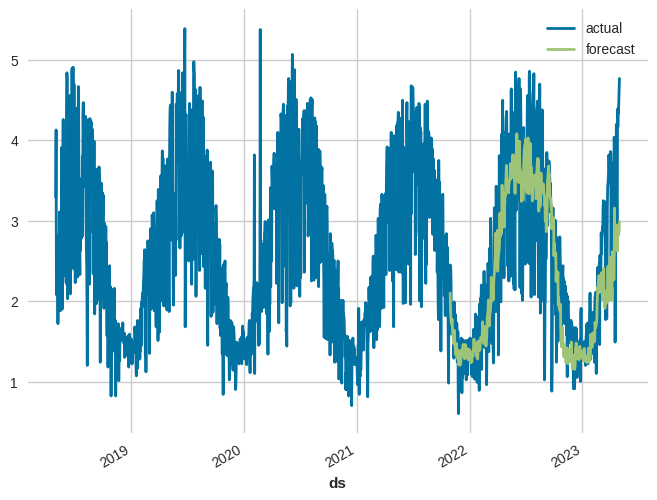

In [24]:
pred = model_neural.predict(n=len(val), series=train)

series.plot(label="actual")
pred.plot(label="forecast")
plt.legend();

In [26]:
mape(pred, val)
#r2_score(pred, val)

23.446143838702994

In [27]:
model_neural.backtest(series= series, start=pd.Timestamp('20220501'), forecast_horizon=7, metric=mape)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 2.8 K  | train
6 | fc              | Sequential       | 182    | train
-------------------------------------------------------------
3.0 K     Trainable params
0         Non-trainable params
3.0 K     Total params
0.012     Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 2.8 K  | train
6 | fc            

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 2.8 K  | train
6 | fc            

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 2.8 K  | train
6 | fc            

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.utilities.rank_zero:GPU available: False, used: False
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type             | Params | Mode 
-------------------------------------------------------------
0 | criterion       | MSELoss          | 0      | train
1 | train_criterion | MSELoss          | 0      | train
2 | val_criterion   | MSELoss          | 0      | train
3 | train_metrics   | MetricCollection | 0      | train
4 | val_metrics     | MetricCollection | 0      | train
5 | rnn             | LSTM             | 2.8 K  | train
6 | fc            

Training: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.trainer.connectors.signal_connector:[rank: 0] Received SIGTERM: 15
INFO:pytorch_lightning.trainer.connectors.signal_connector:[rank: 0] Received SIGTERM: 15
INFO:pytorch_lightning.trainer.connectors.signal_connector:[rank: 0] Received SIGTERM: 15
INFO:pytorch_lightning.trainer.connectors.signal_connector:[rank: 0] Received SIGTERM: 15
INFO:pytorch_lightning.trainer.connectors.signal_connector:[rank: 0] Received SIGTERM: 15


SIGTERMException: 

# PyCaret

In [ ]:
s = setup(train['y'], fh = 14,seasonal_period = 365, session_id = 123)

check_stats()

,Description,Value
0,session_id,123
1,Target,y
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(5754, 1)"
5,Transformed data shape,"(5754, 1)"
6,Transformed train set shape,"(5740, 1)"
7,Transformed test set shape,"(14, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


,Test,Test Name,Data,Property,Setting,Value
0,Summary,Statistics,Transformed,Length,,5754.0
1,Summary,Statistics,Transformed,# Missing Values,,0.0
2,Summary,Statistics,Transformed,Mean,,2.667249
3,Summary,Statistics,Transformed,Median,,2.52
4,Summary,Statistics,Transformed,Standard Deviation,,1.09645
5,Summary,Statistics,Transformed,Variance,,1.202203
6,Summary,Statistics,Transformed,Kurtosis,,-0.8549
7,Summary,Statistics,Transformed,Skewness,,0.424263
8,Summary,Statistics,Transformed,# Distinct Values,,460.0
9,White Noise,Ljung-Box,Transformed,Test Statictic,"{'alpha': 0.05, 'K': 24}",57687.245533


In [ ]:
best = compare_models()

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
exp_smooth,Exponential Smoothing,1.5462,1.3294,0.7965,0.9691,0.2534,0.2204,-0.1706,0.1800
ets,ETS,1.5462,1.3295,0.7965,0.9691,0.2535,0.2204,-0.1707,0.1567
theta,Theta Forecaster,1.5462,1.3287,0.7965,0.9685,0.2532,0.2204,-0.1693,0.0733
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.5699,1.3170,0.8086,0.9599,0.2172,0.2237,-0.2008,0.5033
auto_arima,Auto ARIMA,1.5780,1.3029,0.8129,0.9497,0.2508,0.2243,-0.1310,13.8633
croston,Croston,1.6432,1.3268,0.8465,0.9672,0.2670,0.2328,-0.1735,0.0433
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,1.7933,1.4762,0.9237,1.0760,0.2416,0.2566,-0.6030,0.2667
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.8063,1.4977,0.9304,1.0916,0.2402,0.2595,-0.6418,0.4867
dt_cds_dt,Decision Tree w/ Cond. Deseasonalize & Detrending,1.8107,1.6427,0.9327,1.1974,0.2982,0.2573,-0.7928,0.2367
knn_cds_dt,K Neighbors w/ Cond. Deseasonalize & Detrending,1.8189,1.4945,0.9369,1.0893,0.2458,0.2689,-0.5914,0.4100


Processing:   0%|          | 0/113 [00:00<?, ?it/s]

In [ ]:
top2 = compare_models(n_select = 2)
blender = blend_models(top2)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
exp_smooth,Exponential Smoothing,1.5462,1.3294,0.7965,0.9691,0.2534,0.2204,-0.1706,0.1467
ets,ETS,1.5462,1.3295,0.7965,0.9691,0.2535,0.2204,-0.1707,0.1233
theta,Theta Forecaster,1.5462,1.3287,0.7965,0.9685,0.2532,0.2204,-0.1693,0.0733
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.5699,1.3170,0.8086,0.9599,0.2172,0.2237,-0.2008,0.4200
auto_arima,Auto ARIMA,1.5780,1.3029,0.8129,0.9497,0.2508,0.2243,-0.1310,13.3833
croston,Croston,1.6432,1.3268,0.8465,0.9672,0.2670,0.2328,-0.1735,0.0367
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,1.7933,1.4762,0.9237,1.0760,0.2416,0.2566,-0.6030,0.2867
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.8063,1.4977,0.9304,1.0916,0.2402,0.2595,-0.6418,0.4900
dt_cds_dt,Decision Tree w/ Cond. Deseasonalize & Detrending,1.8107,1.6427,0.9327,1.1974,0.2982,0.2573,-0.7928,0.2200
knn_cds_dt,K Neighbors w/ Cond. Deseasonalize & Detrending,1.8189,1.4945,0.9369,1.0893,0.2458,0.2689,-0.5914,0.3567


Processing:   0%|          | 0/114 [00:00<?, ?it/s]

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,5697.0000,1.5136,1.3060,0.7787,0.9509,0.2067,0.2148,-0.1490
1,5711.0000,1.0980,1.0648,0.5656,0.7762,0.1735,0.1447,-0.0214
2,5725.0000,2.0269,1.6177,1.0452,1.1802,0.3802,0.3017,-0.3416
Mean,nan,1.5462,1.3295,0.7965,0.9691,0.2535,0.2204,-0.1707
SD,nan,0.3799,0.2263,0.1962,0.1654,0.0906,0.0642,0.1316


Processing:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
plot_model(blender, plot = 'forecast')

In [ ]:
plot_model(plot="diagnostics", fig_kwargs={"height": 800, "width": 1000})